In [1]:
import numpy as np
import pandas as pd
import scipy as sp
import scanpy as sc
from glob import glob
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib as mpl
from matplotlib.pyplot import rc_context
import os
import seaborn as sns
import importlib
import re

In [2]:
import degSummary
from scanpyColor import godsnot_102

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=150, facecolor='white', dpi_save=600)
sc._settings.ScanpyConfig(max_memory=50, n_jobs=50)

scanpy==1.8.2 anndata==0.7.5 umap==0.5.3 numpy==1.23.5 scipy==1.10.0 pandas==1.5.3 scikit-learn==1.2.0 statsmodels==0.13.5 python-igraph==0.10.3 louvain==0.8.0 pynndescent==0.5.8


In [4]:
sns.set_theme(style="ticks")

# Load data

In [5]:
os.chdir('../..')

In [6]:
pwd

'/data/tcl/Project/ADFCA'

In [7]:
age_L=['10', '20', '30']
ageColor_L=['#1F77B4', '#FF7F0E', '#2CA02C', '#D62728']
ageColor_L2=['#009ACD', '#FF7D40', '#2CA02C', '#D62728']
ggplotColor3_L= ["#F8766D", "#00BA38", "#619CFF"]
set2Color_L=["#66C2A5", "#E9936A", "#A89BB0"]

In [8]:
genotype_L=['control', 'AB42', 'hTau']

In [9]:
figureDataFolder=f'Analysis/Figure'
os.makedirs(figureDataFolder, exist_ok=True)
figure1Folder=f'{figureDataFolder}/Figure1'
os.makedirs(figure1Folder, exist_ok=True)
figure1PicFolder=f'{figure1Folder}/pic'
os.makedirs(figure1PicFolder, exist_ok=True)

In [10]:
genoAge_L = ['control_10', 'control_20', 'control_30', 'AB42_10', 'AB42_20', 'hTau_20', 'hTau_30']

In [11]:
genoAgeSex_L = ['control_10_female', 'control_20_female', 'control_30_female', 'control_10_male', 'control_20_male', 'control_30_male', 
                'AB42_10_female', 'AB42_20_female', 'AB42_10_male', 'AB42_20_male', 
                'hTau_20_female', 'hTau_30_female', 'hTau_20_male', 'hTau_30_male']

In [12]:
annotBroadFolder='Analysis/7.broadAnnot'

# Fig. 1F: Broad annotations

## Merged data

### HVG to tsne

In [13]:
adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_head_v0.6_woHarmony_raw.h5ad')
adata_body = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_body_v0.6_woHarmony_raw.h5ad')

In [14]:
adata_headBody = adata_head.concatenate(adata_body, join='outer')

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [15]:
adata_headBody

AnnData object with n_obs × n_vars = 624458 × 16219
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_genes', 'dataset', 'cellBC', 'sex', 'tissue', 'age', 'genotype', 'sex_age', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch', 'leiden', 'genoAge', 'genoAgeSex', 'adfca_annotation', 'adfca_annotation_broad', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_3.0', 'leiden_4.0', 'leiden_5.0', 'leiden_6.0', 'leiden_7.0', 'leiden_8.0', 'leiden_9.0', 'leiden_10.0', 'adfca_annotation_group', 'adfca_annotation_subcluster'
    var: 'gene_ids', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'latent_gene_encoding'
    layers: 'logNormalize_exp', 'umi_counts'

extracting highly variable genes
    finished (0:00:18)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


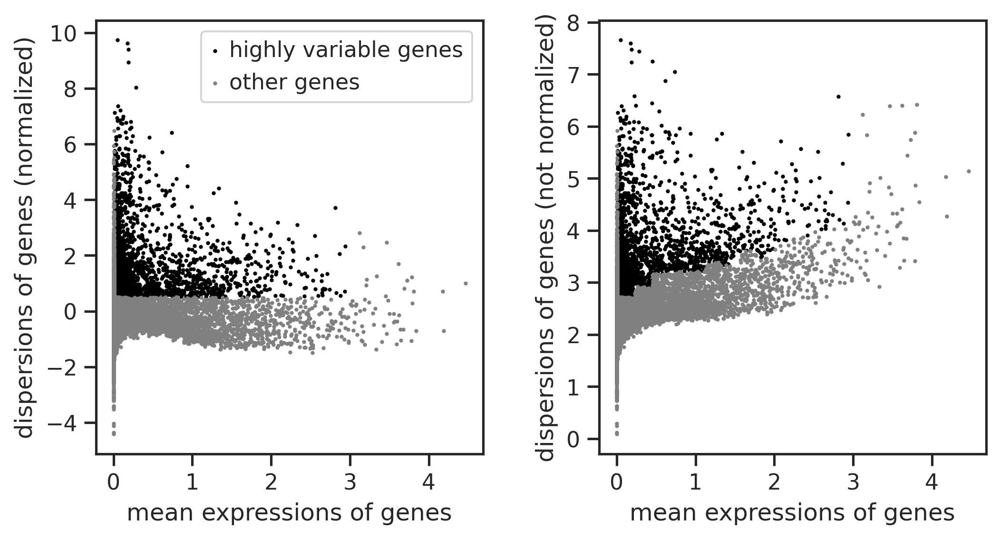

False    14165
True      2054
Name: highly_variable, dtype: int64

In [16]:
# HVG
sc.pp.highly_variable_genes(adata_headBody, min_mean=0.01, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata_headBody)
adata_headBody.var['highly_variable'].value_counts()

In [17]:
adata_headBody.raw = adata_headBody
adata_headBody = adata_headBody[:, adata_headBody.var.highly_variable]

# sc.pp.regress_out(adata_headBody, ['total_counts'], n_jobs=50)
sc.pp.scale(adata_headBody, max_value=10)

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [18]:
adata_headBody

AnnData object with n_obs × n_vars = 624458 × 2054
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_genes', 'dataset', 'cellBC', 'sex', 'tissue', 'age', 'genotype', 'sex_age', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch', 'leiden', 'genoAge', 'genoAgeSex', 'adfca_annotation', 'adfca_annotation_broad', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_3.0', 'leiden_4.0', 'leiden_5.0', 'leiden_6.0', 'leiden_7.0', 'leiden_8.0', 'leiden_9.0', 'leiden_10.0', 'adfca_annotation_group', 'adfca_annotation_subcluster'
    var: 'gene_ids', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'latent_gene_encoding'
    layers: 'logNormalize_exp', 'umi_counts'

computing PCA
    on highly variable genes
    with n_comps=150
    finished (0:02:14)


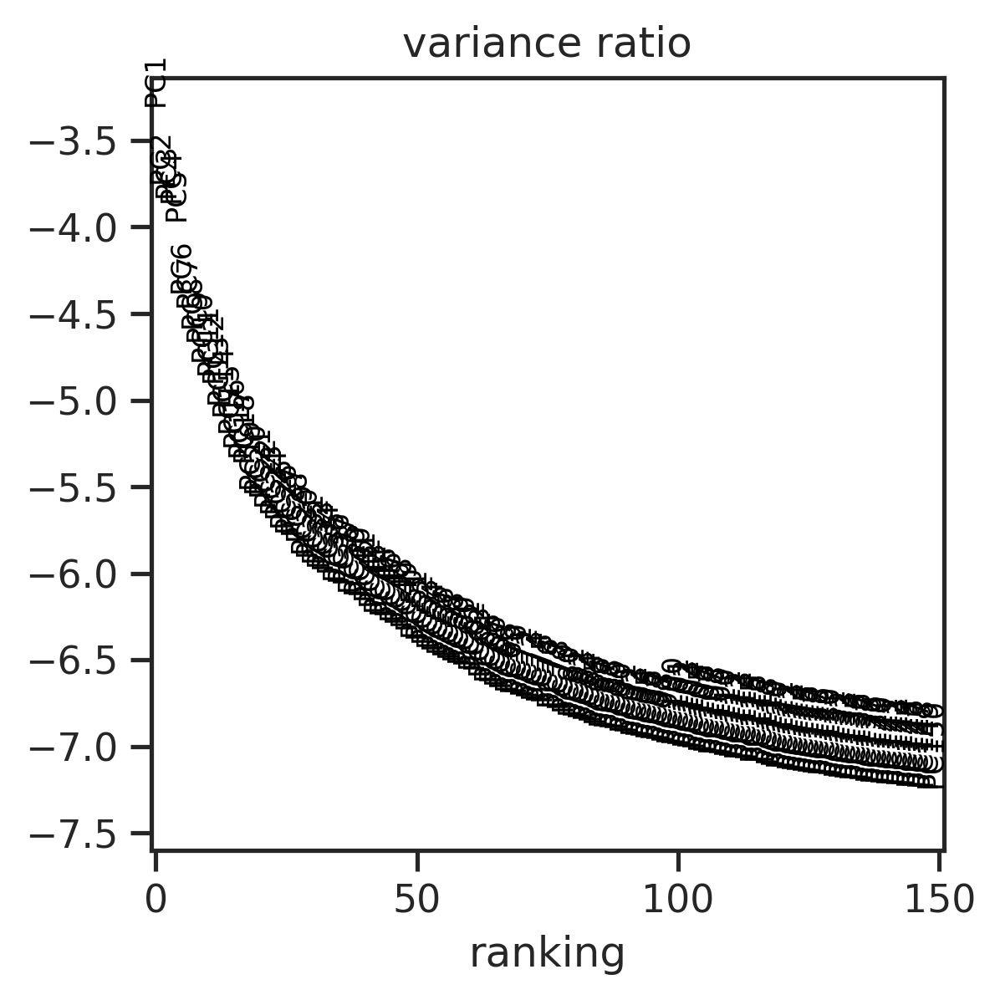

In [19]:
# PCA
sc.tl.pca(adata_headBody, svd_solver='arpack', n_comps=150)
sc.pl.pca_variance_ratio(adata_headBody, log=True, n_pcs=150)

In [20]:
# nn
sc.pp.neighbors(adata_headBody, n_neighbors=15, n_pcs= 50)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:22)


In [21]:
sc.tl.tsne(adata_headBody, n_jobs=50, n_pcs=50)
sc.tl.umap(adata_headBody)

computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE


/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/tools/_tsne.py:113: UserWarning: In previous versions of scanpy, calling tsne with n_jobs > 1 would use MulticoreTSNE. Now this uses the scikit-learn version of TSNE by default. If you'd like the old behaviour (which is deprecated), pass 'use_fast_tsne=True'. Note, MulticoreTSNE is not actually faster anymore.
  warnings.warn(


    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:19:18)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:10:59)


In [22]:
sc.tl.leiden(adata_headBody)

running Leiden clustering


IOStream.flush timed out


    finished: found 64 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:04:58)


In [23]:
adata_headBody.write(f'{figure1Folder}/adata_headBody_HVG_to_tsne.h5ad')

### Plot broad annotation

In [24]:
adata_headBody=sc.read(f'{figure1Folder}/adata_headBody_HVG_to_tsne.h5ad')

In [25]:
# import random

In [26]:
adata_headBody.uns.keys()

dict_keys(['hvg', 'leiden', 'neighbors', 'pca', 'tsne', 'umap'])

In [27]:
color_L1 = ['#9edae5', '#d62728', '#17becf', '#dbdb8d', '#ff9896', '#8c564b', '#7f7f7f', '#98df8a', '#c49c94', '#e377c2', '#ff7f0e', '#ffbb78', '#2ca02c', '#1f77b4',
           '#c7c7c7', '#c5b0d5', '#f7b6d2', '#9467bd', '#bcbd22','#aec7e8']

In [28]:
color_L2 = ['#dbdb8d', '#c5b0d5', '#f7b6d2', '#ffbb78', '#c49c94', '#1f77b4', '#ff7f0e', '#ff9896', '#7f7f7f', '#98df8a', '#aec7e8', '#8c564b', '#9467bd', '#2ca02c',
 '#d62728', '#bcbd22', '#e377c2', '#9edae5', '#17becf', '#c7c7c7']

In [29]:
adata_headBody.obs.adfca_annotation_broad.cat.categories

Index(['CNS neuron', 'PNS neuron', 'cardial cell', 'epithelial cell',
       'excretory system', 'fat cell', 'female germline cell',
       'female reproductive system', 'gland', 'glial cell', 'gut cell',
       'hemocyte', 'male germline cell', 'male reproductive system',
       'muscle cell', 'oenocyte', 'sensory neuron', 'tracheal cell',
       'unannotated'],
      dtype='object')

In [30]:
len(adata_headBody.obs.adfca_annotation_broad.cat.categories)

19

In [31]:
len(color_L1)

20

In [32]:
broadColor1_D = dict(zip(adata_headBody.obs.adfca_annotation_broad.cat.categories, color_L1))
broadColor2_D = dict(zip(adata_headBody.obs.adfca_annotation_broad.cat.categories, color_L2))

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


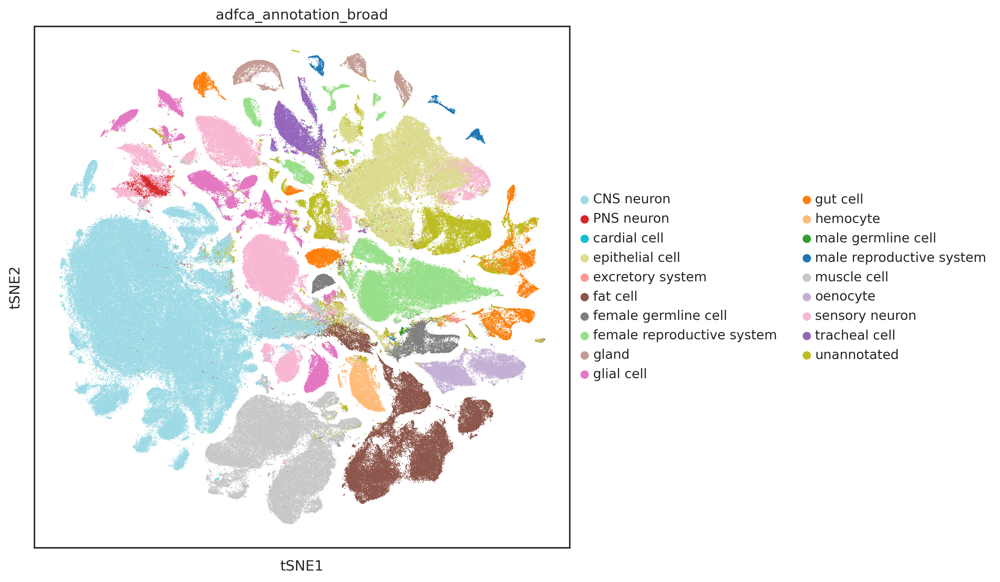

In [33]:
with rc_context({'figure.figsize': (8, 8)}):
    sc.pl.tsne(adata_headBody, color='adfca_annotation_broad', size=2, palette=color_L1, # palette=random.sample(sc.pl.palettes.vega_20, 20) 
               save=f'_adata_headBody_adfca_annotation_broad1_20230930.pdf')

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


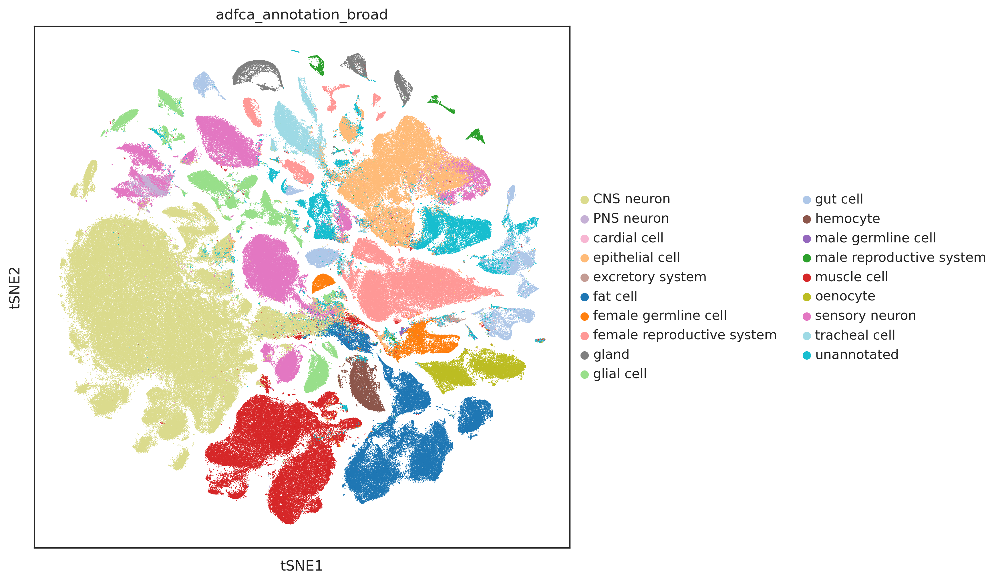

In [34]:
with rc_context({'figure.figsize': (8, 8)}):
    sc.pl.tsne(adata_headBody, color='adfca_annotation_broad', size=2, palette=color_L2, # palette=random.sample(sc.pl.palettes.vega_20, 20) 
               save=f'_adata_headBody_adfca_annotation_broad2_20230930.pdf')

In [35]:
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{figure1PicFolder}/{x}')

In [36]:
broadColor1_D

{'CNS neuron': '#9edae5',
 'PNS neuron': '#d62728',
 'cardial cell': '#17becf',
 'epithelial cell': '#dbdb8d',
 'excretory system': '#ff9896',
 'fat cell': '#8c564b',
 'female germline cell': '#7f7f7f',
 'female reproductive system': '#98df8a',
 'gland': '#c49c94',
 'glial cell': '#e377c2',
 'gut cell': '#ff7f0e',
 'hemocyte': '#ffbb78',
 'male germline cell': '#2ca02c',
 'male reproductive system': '#1f77b4',
 'muscle cell': '#c7c7c7',
 'oenocyte': '#c5b0d5',
 'sensory neuron': '#f7b6d2',
 'tracheal cell': '#9467bd',
 'unannotated': '#bcbd22'}

In [37]:
broadColor2_D

{'CNS neuron': '#dbdb8d',
 'PNS neuron': '#c5b0d5',
 'cardial cell': '#f7b6d2',
 'epithelial cell': '#ffbb78',
 'excretory system': '#c49c94',
 'fat cell': '#1f77b4',
 'female germline cell': '#ff7f0e',
 'female reproductive system': '#ff9896',
 'gland': '#7f7f7f',
 'glial cell': '#98df8a',
 'gut cell': '#aec7e8',
 'hemocyte': '#8c564b',
 'male germline cell': '#9467bd',
 'male reproductive system': '#2ca02c',
 'muscle cell': '#d62728',
 'oenocyte': '#bcbd22',
 'sensory neuron': '#e377c2',
 'tracheal cell': '#9edae5',
 'unannotated': '#17becf'}

In [38]:
broadColor1_Df = pd.DataFrame(index = sorted(broadColor1_D.keys()))
broadColor1_Df.loc[:,'colorKey'] = [broadColor1_D[annot] for annot in broadColor1_Df.index]

broadColor1_Df

,colorKey
CNS neuron,#9edae5
PNS neuron,#d62728
cardial cell,#17becf
epithelial cell,#dbdb8d
excretory system,#ff9896
fat cell,#8c564b
female germline cell,#7f7f7f
female reproductive system,#98df8a
gland,#c49c94
glial cell,#e377c2


In [39]:
broadColor2_Df = pd.DataFrame(index = sorted(broadColor2_D.keys()))
broadColor2_Df.loc[:,'colorKey'] = [broadColor2_D[annot] for annot in broadColor2_Df.index]

broadColor2_Df

,colorKey
CNS neuron,#dbdb8d
PNS neuron,#c5b0d5
cardial cell,#f7b6d2
epithelial cell,#ffbb78
excretory system,#c49c94
fat cell,#1f77b4
female germline cell,#ff7f0e
female reproductive system,#ff9896
gland,#7f7f7f
glial cell,#98df8a


In [40]:
broadColor1_Df.to_csv(f'{figure1Folder}/broadColor1_Df.csv')
broadColor2_Df.to_csv(f'{figure1Folder}/broadColor2_Df.csv')

In [41]:
adata_headBody.write(f'{figure1Folder}/adata_headBody_HVG_to_tsne.h5ad')

### Plot tsne for each genotype

In [42]:
adata_headBody=sc.read(f'{figure1Folder}/adata_headBody_HVG_to_tsne.h5ad')

In [43]:
with rc_context({'figure.figsize': (8, 8)}):
    for genotype in genotype_L:
        sc.pl.tsne(adata_headBody, color='genotype', groups=genotype, size=2, na_in_legend=False, title=f'{genotype}', frameon=False, show=False,
                   save=f'_adata_headBody_genotype_{genotype}.pdf')

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


In [44]:
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{figure1PicFolder}/{x}')

### Plot genotypes: show all genotypes in one plot

In [45]:
with rc_context({'figure.figsize': (8, 8)}):
    sc.pl.tsne(adata_headBody, color='genotype', na_in_legend=False, title=f'All genotypes', frameon=False, show=False,
               save=f'_adata_headBody_genotype_all.pdf')

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


In [46]:
with rc_context({'figure.figsize': (8, 8)}):
    sc.pl.tsne(adata_headBody, color='genotype', size=0.5, na_in_legend=False, title=f'All genotypes', frameon=False, show=False,
               save=f'_adata_headBody_genotype_all_size0.5.pdf')

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


In [47]:
with rc_context({'figure.figsize': (8, 8)}):
    sc.pl.tsne(adata_headBody, color='genotype', size=1, na_in_legend=False, title=f'All genotypes', frameon=False, show=False,
               save=f'_adata_headBody_genotype_all_size1.pdf')

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


In [48]:
with rc_context({'figure.figsize': (8, 8)}):
    sc.pl.tsne(adata_headBody, color='genotype', size=2, na_in_legend=False, title=f'All genotypes', frameon=False, show=False,
               save=f'_adata_headBody_genotype_all_size2.pdf')

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


In [49]:
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{figure1PicFolder}/{x}')

## Head, body separated

In [59]:
adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.5/adfca_head_v0.5_woHarmony.h5ad')
adata_body = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.5/adfca_body_v0.5_woHarmony.h5ad')

In [60]:
adata_headBody = sc.read(f'{figure1Folder}/adata_headBody_HVG_to_tsne.h5ad')

In [61]:
color_L1 = ['#9edae5', '#d62728', '#17becf', '#dbdb8d', '#ff9896', '#8c564b', '#7f7f7f', '#98df8a', '#c49c94', '#e377c2', '#ff7f0e', '#ffbb78', '#2ca02c', '#1f77b4',
           '#c7c7c7', '#c5b0d5', '#f7b6d2', '#9467bd', '#bcbd22', '#aec7e8']

In [62]:
color_L2 = ['#dbdb8d', '#c5b0d5', '#f7b6d2', '#ffbb78', '#c49c94', '#1f77b4', '#ff7f0e', '#ff9896', '#7f7f7f', '#98df8a', '#aec7e8', '#8c564b', '#9467bd', '#2ca02c',
 '#d62728', '#bcbd22', '#e377c2', '#9edae5', '#17becf', '#c7c7c7']

In [63]:
broadColor1_D = dict(zip(adata_headBody.obs.adfca_annotation_broad.cat.categories, color_L1))
broadColor2_D = dict(zip(adata_headBody.obs.adfca_annotation_broad.cat.categories, color_L2))

In [64]:
adata_head.obs.adfca_annotation_broad.cat.categories

Index(['CNS neuron', 'epithelial cell', 'fat cell', 'glial cell', 'hemocyte',
       'muscle cell', 'sensory neuron', 'tracheal cell', 'unannotated'],
      dtype='object')

In [65]:
adata_head.obs.adfca_annotation_broad.cat.categories

Index(['CNS neuron', 'epithelial cell', 'fat cell', 'glial cell', 'hemocyte',
       'muscle cell', 'sensory neuron', 'tracheal cell', 'unannotated'],
      dtype='object')

In [66]:
with rc_context({'figure.figsize': (8, 8)}):
    sc.pl.tsne(adata_head, color='adfca_annotation_broad', size=2, show=False, frameon=False, # palette=random.sample(sc.pl.palettes.vega_20, 20) 
               palette=[broadColor1_D[annot] for annot in adata_head.obs.adfca_annotation_broad.cat.categories],
               save=f'_adata_head_adfca_annotation_broad_color1.pdf')
    sc.pl.tsne(adata_body, color='adfca_annotation_broad', size=2, show=False, frameon=False, # palette=random.sample(sc.pl.palettes.vega_20, 20) 
               palette=[broadColor1_D[annot] for annot in adata_body.obs.adfca_annotation_broad.cat.categories],
               save=f'_adata_body_adfca_annotation_broad_color1.pdf')

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


In [67]:
# broadColor_D = dict(zip(adata_headBody.obs.adfca_annotation_broad.cat.categories, adata_headBody.uns['adfca_annotation_broad_colors']))

In [68]:
with rc_context({'figure.figsize': (8, 8)}):
    sc.pl.tsne(adata_head, color='adfca_annotation_broad', size=2, show=False, frameon=False,
               palette=[broadColor2_D[annot] for annot in adata_head.obs.adfca_annotation_broad.cat.categories], # palette=random.sample(sc.pl.palettes.vega_20, 20) 
               save=f'_adata_head_adfca_annotation_broad_color2.pdf')
    sc.pl.tsne(adata_body, color='adfca_annotation_broad', size=2, show=False, frameon=False,
               palette=[broadColor2_D[annot] for annot in adata_body.obs.adfca_annotation_broad.cat.categories], # palette=random.sample(sc.pl.palettes.vega_20, 20) 
               save=f'_adata_body_adfca_annotation_broad_color2..pdf')

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


In [69]:
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{figure1PicFolder}/{x}')

# Sup figures

## Load files

In [15]:
adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_head_v0.6_woHarmony_raw.h5ad')
adata_body = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_body_v0.6_woHarmony_raw.h5ad')

In [16]:
adata_headBody = adata_head.concatenate(adata_body, join='outer')
adata_headBody

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


AnnData object with n_obs × n_vars = 624458 × 16219
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_genes', 'dataset', 'cellBC', 'sex', 'tissue', 'age', 'genotype', 'sex_age', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch', 'leiden', 'genoAge', 'genoAgeSex', 'adfca_annotation', 'adfca_annotation_broad', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_3.0', 'leiden_4.0', 'leiden_5.0', 'leiden_6.0', 'leiden_7.0', 'leiden_8.0', 'leiden_9.0', 'leiden_10.0', 'adfca_annotation_group', 'adfca_annotation_subcluster'
    var: 'gene_ids', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'latent_gene_encoding'
    layers: 'logNormalize_exp', 'umi_counts'

## Expression of AB42 and hTau

In [19]:
with rc_context({'figure.figsize': (6, 6)}):
    for gene in ['ABeta42', 'hTau0N4Rfull', 'nSyb'][:]:
        sc.pl.tsne(adata_head, color=gene, size=2, frameon=False, show=False, cmap="Reds", vmin=1, vmax=6,
                   save=f'_adata_head_adfca_{gene}.pdf')
        sc.pl.tsne(adata_body, color=gene, size=2, frameon=False, show=False, cmap="Reds", vmin=1, vmax=6,
                   save=f'_adata_body_adfca_{gene}.pdf')

In [20]:
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{figure1PicFolder}/{x}')

# Sup figures: head/body annotations

In [16]:
adata_head = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_head_v0.6_woHarmony_raw.h5ad')
adata_body = sc.read('/data/tcl/Project/ADFCA/adataProcess/v0.6/adfca_body_v0.6_woHarmony_raw.h5ad')

## Colored by adfca_annotation

In [18]:
# with rc_context({'figure.figsize': (18, 6)}):
for adata in [adata_head, adata_body]:
    tissue = adata.obs.tissue[0]
    
    figU, ax = plt.subplots(figsize=(6, 6))
    sc.pl.tsne(adata, color=['adfca_annotation'], frameon=False, 
               na_in_legend=False, show=False, size=1, ax= ax, title=f'{tissue}') # size=2, 
    plt.savefig(f'{figure1PicFolder}/tsne_adfca_{tissue}_adfca_annotation.pdf', bbox_inches='tight')
    plt.close()
    
    figU, ax = plt.subplots(figsize=(6, 6))
    sc.pl.tsne(adata, color=['adfca_annotation'], frameon=False, legend_loc=False,
               na_in_legend=False, show=False, size=1, ax= ax, title=f'{tissue}') # size=2, 
    plt.savefig(f'{figure1PicFolder}/tsne_adfca_{tissue}_adfca_annotation_noLegend.pdf', bbox_inches='tight')
    plt.close()

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


# Finish

# All un-used plots are listed below

## Separated by genotypes

In [17]:
# with rc_context({'figure.figsize': (18, 6)}):
for adata in [adata_head, adata_body]:
    tissue = adata.obs.tissue[0]
    
    figU, axsU = plt.subplots(1, 3, figsize=(18, 5.5))
    for n, genotype in enumerate(genotype_L):
        sc.pl.umap(adata,color=['genotype'], groups=genotype, frameon=False, legend_loc=False,
                   na_in_legend=False, show=False, size=1, ax= axsU[n], title=f'{tissue}_{genotype}') # 
    plt.savefig(f'{figure1PicFolder}/umap_adfca_{tissue}_genotype_each.pdf', bbox_inches='tight')
    plt.close()
    
    figU, axsU = plt.subplots(1, 3, figsize=(18, 5.5))
    for n, genotype in enumerate(genotype_L):
        sc.pl.tsne(adata,color=['genotype'], groups=genotype, frameon=False, legend_loc=False,
                   na_in_legend=False, show=False, size=1, ax= axsU[n], title=f'{tissue}_{genotype}') # size=2, 
    plt.savefig(f'{figure1PicFolder}/tsne_adfca_{tissue}_genotype_each.pdf', bbox_inches='tight')
    plt.close()

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas al

## Separat each dataset

In [ ]:
with rc_context({'figure.figsize': (6, 6)}):
    for adata in [adata_head, adata_body]:
        tissue = adata.obs.tissue[0]

        for n, genotype in enumerate(genotype_L):
            sc.pl.tsne(adata, color=['genotype'], groups=genotype, frameon=False, legend_loc=False, 
                       na_in_legend=False, show=False, size=3, title=f'{tissue}_{genotype}', 
                       save=f'_adata_{tissue}_{genotype}.pdf')

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


In [ ]:
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{figure1PicFolder}/{x}')

## Separated by sex

In [ ]:
# with rc_context({'figure.figsize': (18, 6)}):
for adata in [adata_head, adata_body]:
    tissue = adata.obs.tissue[0]
    
    figU, axsU = plt.subplots(1, 2, figsize=(12, 5.5))
    for n, sex in enumerate(['female', 'male']):
        sc.pl.umap(adata, color=['sex'], groups=sex, frameon=False, legend_loc=False,
                   na_in_legend=False, show=False, size=1, ax= axsU[n], title=f'{tissue}_{sex}') # 
    plt.savefig(f'{figure1PicFolder}/umap_adfca_{tissue}_sex_each.pdf', bbox_inches='tight')
    plt.close()
    
    figU, axsU = plt.subplots(1, 2, figsize=(12, 5.5))
    for n, sex in enumerate(['female', 'male']):
        sc.pl.tsne(adata, color=['sex'], groups=sex, frameon=False, legend_loc=False,
                   na_in_legend=False, show=False, size=1, ax= axsU[n], title=f'{tissue}_{sex}') # size=2, 
    plt.savefig(f'{figure1PicFolder}/tsne_adfca_{tissue}_sex_each.pdf', bbox_inches='tight')
    plt.close()

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas al

In [ ]:
# with rc_context({'figure.figsize': (18, 6)}):
for adata in [adata_head, adata_body]:
    tissue = adata.obs.tissue[0]
    
    figU, axsU = plt.subplots(1, 2, figsize=(12, 5.5))
    for n, sex in enumerate(['female', 'male']):
        sc.pl.umap(adata, color=['sex'], groups=sex, frameon=False, legend_loc=False, palette= 'Spectral',
                   na_in_legend=False, show=False, size=1, ax= axsU[n], title=f'{tissue}_{sex}') # 
    plt.savefig(f'{figure1PicFolder}/umap_adfca_{tissue}_sex_each2.pdf', bbox_inches='tight')
    plt.close()
    
    figU, axsU = plt.subplots(1, 2, figsize=(12, 5.5))
    for n, sex in enumerate(['female', 'male']):
        sc.pl.tsne(adata, color=['sex'], groups=sex, frameon=False, legend_loc=False, palette= 'Spectral',
                   na_in_legend=False, show=False, size=1, ax= axsU[n], title=f'{tissue}_{sex}') # size=2, 
    plt.savefig(f'{figure1PicFolder}/tsne_adfca_{tissue}_sex_each2.pdf', bbox_inches='tight')
    plt.close()

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas al

## colored by "genoSex"

In [21]:
adata_head.obs['genoSex'] = pd.Categorical( adata_head.obs.genotype.astype(str) + '_' + adata_head.obs.sex.astype(str), categories= ['control_female', 'control_male', 'AB42_female', 'AB42_male', 'hTau_female', 'hTau_male'] )
adata_body.obs['genoSex'] = pd.Categorical( adata_body.obs.genotype.astype(str) + '_' + adata_body.obs.sex.astype(str), categories= ['control_female', 'control_male', 'AB42_female', 'AB42_male', 'hTau_female', 'hTau_male'] )

In [22]:
adata_head.obs.genoSex.cat.categories

Index(['control_female', 'control_male', 'AB42_female', 'AB42_male',
       'hTau_female', 'hTau_male'],
      dtype='object')

In [23]:
# with rc_context({'figure.figsize': (18, 6)}):
for adata in [adata_head, adata_body]:
    tissue = adata.obs.tissue[0]
    
    figU, axsU = plt.subplots(2, 3, figsize=(18, 12))
    for n, sex in enumerate(['female', 'male']):
        for k, genotype in enumerate(genotype_L):
            sc.pl.umap(adata, color=['genoSex'], groups=f'{genotype}_{sex}', frameon=False, legend_loc=False,
                       na_in_legend=False, show=False, size=1, ax= axsU[n, k], title=f'{tissue}_{genotype}_{sex}') # 
    plt.savefig(f'{figure1PicFolder}/umap_adfca_{tissue}_genosex_each.pdf', bbox_inches='tight')
    plt.close()
    
    figU, axsU = plt.subplots(2, 3, figsize=(18, 12))
    for n, sex in enumerate(['female', 'male']):
        for k, genotype in enumerate(genotype_L):
            sc.pl.tsne(adata, color=['genoSex'], groups=f'{genotype}_{sex}', frameon=False, legend_loc=False,
                       na_in_legend=False, show=False, size=1, ax= axsU[n, k], title=f'{tissue}_{genotype}_{sex}') # 
    plt.savefig(f'{figure1PicFolder}/tsne_adfca_{tissue}_genosex_each.pdf', bbox_inches='tight')
    plt.close()
            

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas al

In [24]:
# with rc_context({'figure.figsize': (18, 6)}):
for adata in [adata_head, adata_body]:
    tissue = adata.obs.tissue[0]
    
    figU, axsU = plt.subplots(3, 3, figsize=(18, 18))
    for n, age in enumerate(age_L):
        for k, genotype in enumerate(genotype_L):
            sc.pl.umap(adata, color=['genoAge'], groups=f'{genotype}_{age}', frameon=False, legend_loc=False,
                       na_in_legend=False, show=False, size=1, ax= axsU[n, k], title=f'{tissue}_{genotype}_{age}') # 
    plt.savefig(f'{figure1PicFolder}/umap_adfca_{tissue}_genoAge_each.pdf', bbox_inches='tight')
    plt.close()
    
    figU, axsU = plt.subplots(3, 3, figsize=(18, 18))
    for n, age in enumerate(age_L):
        for k, genotype in enumerate(genotype_L):
            sc.pl.tsne(adata, color=['genoAge'], groups=f'{genotype}_{age}', frameon=False, legend_loc=False,
                       na_in_legend=False, show=False, size=1, ax= axsU[n, k], title=f'{tissue}_{genotype}_{age}') # 
    plt.savefig(f'{figure1PicFolder}/tsne_adfca_{tissue}_genoAge_each.pdf', bbox_inches='tight')
    plt.close()
            

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas al

In [25]:
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{figure1PicFolder}/{x}')

## Basic QC

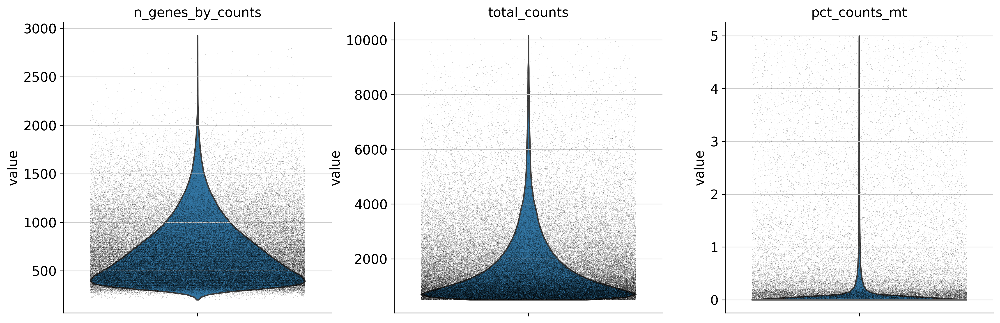

In [74]:
sc.pl.violin(adata_headBody, keys=['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True, size=0.1)

In [75]:
adata_headBody.obs.tissue.value_counts()

head    360036
body    264422
Name: tissue, dtype: int64

In [76]:
adata_headBody.obs.genoAgeSex = pd.Categorical(adata_headBody.obs.genoAgeSex, categories=genoAgeSex_L)

In [77]:
# with rc_context({'figure.figsize': (12, 4)}):
for feature in ['n_genes_by_counts', 'total_counts', 'pct_counts_mt']:
    figs, axs = plt.subplots(1, 2, figsize=(14, 4))
    for n, tissue in enumerate(['head', 'body']):
        sc.pl.violin(adata_headBody[adata_headBody.obs.tissue == tissue], keys=feature, groupby='genoAgeSex', jitter=0.4, size=0.1, rotation=90, ax=axs[n],  show=False, )
        axs[n].title.set_text(f'{tissue}_{feature}')
    plt.savefig(f'{figure1PicFolder}/violin_{feature}_groupbyGenoAgeSex_rankedByAge.pdf', bbox_inches='tight')
    plt.close()

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata

In [78]:
genoAgeSex_L0 = ['control_10_female',
 'control_20_female',
 'control_30_female',
 'control_10_male',
 'control_20_male',
 'control_30_male',
 'AB42_10_female',
 'AB42_20_female',
 'AB42_10_male',
 'AB42_20_male',
 'hTau_20_female',
 'hTau_30_female',
 'hTau_20_male',
 'hTau_30_male']

In [79]:
genoAgeSex_L = ['control_10_female', 'control_10_male', 'AB42_10_female', 'AB42_10_male',
                'control_20_female', 'control_20_male', 'AB42_20_female', 'AB42_20_male', 'hTau_20_female', 'hTau_20_male', 
                'control_30_female', 'control_30_male', 'AB42_30_female', 'AB42_30_male', 'hTau_30_female', 'hTau_30_male',]

In [80]:
adata_headBody.obs.genoAgeSex = pd.Categorical(adata_headBody.obs.genoAgeSex, categories=genoAgeSex_L)

In [81]:
# with rc_context({'figure.figsize': (12, 4)}):
for feature in ['n_genes_by_counts', 'total_counts', 'pct_counts_mt']:
    figs, axs = plt.subplots(1, 2, figsize=(14, 4))
    for n, tissue in enumerate(['head', 'body']):
        sc.pl.violin(adata_headBody[adata_headBody.obs.tissue == tissue], keys=feature, groupby='genoAgeSex', jitter=0.4, size=0.1, rotation=90, ax=axs[n],  show=False, )
        axs[n].title.set_text(f'{tissue}_{feature}')
    plt.savefig(f'{figure1PicFolder}/violin_{feature}_groupbyGenoAgeSex.pdf', bbox_inches='tight')
    plt.close()

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


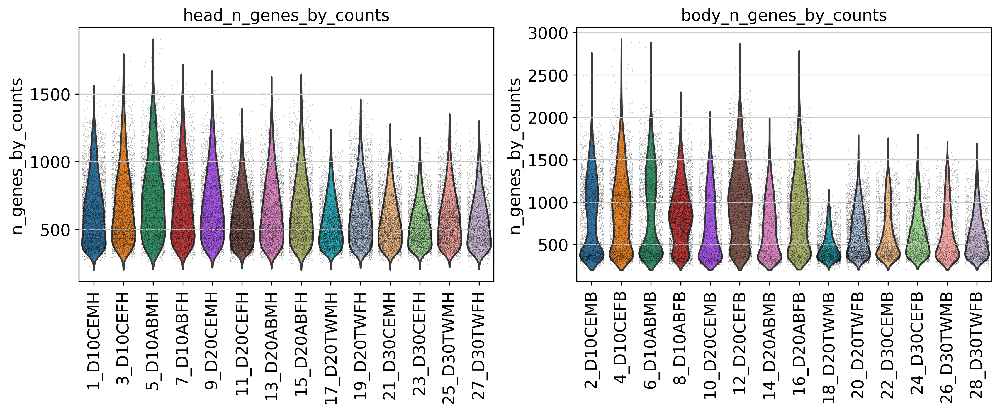

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


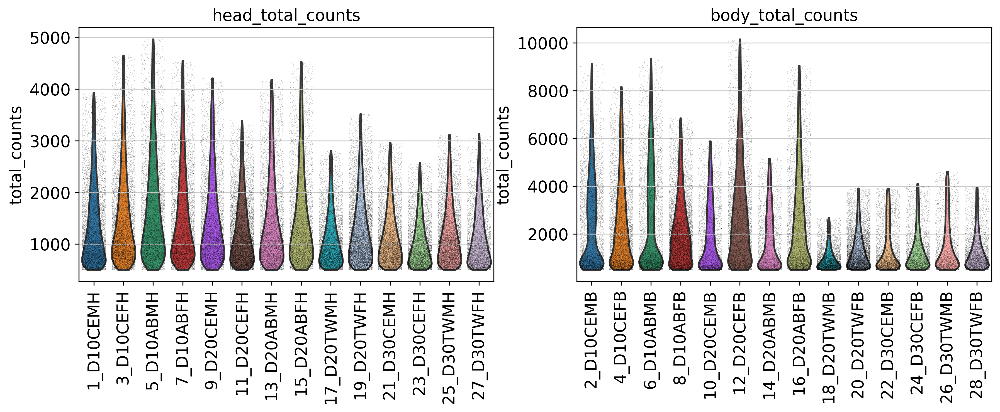

/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/data/tcl/miniconda3/envs/scanpy182/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


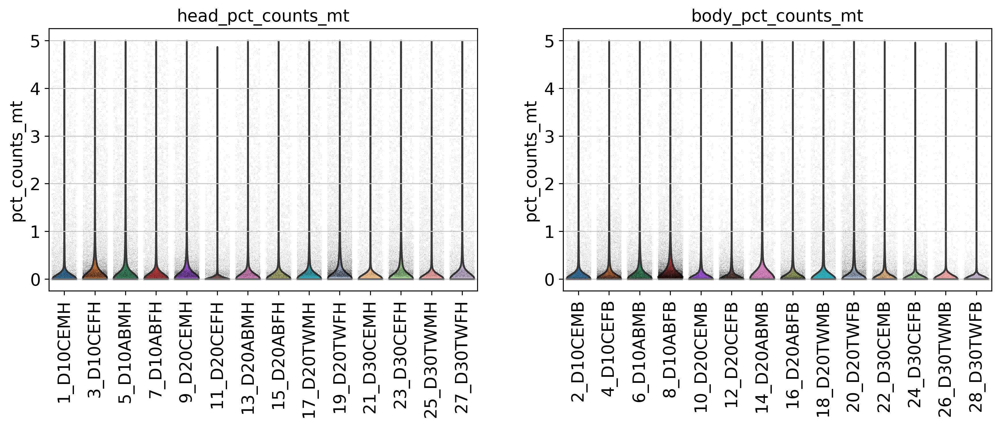

In [82]:
# with rc_context({'figure.figsize': (12, 4)}):
for feature in ['n_genes_by_counts', 'total_counts', 'pct_counts_mt']:
    figs, axs = plt.subplots(1, 2, figsize=(14, 4))
    for n, tissue in enumerate(['head', 'body']):
        sc.pl.violin(adata_headBody[adata_headBody.obs.tissue == tissue], keys=feature, groupby='dataset', jitter=0.4, size=0.1, rotation=90, ax=axs[n],  show=False, )
        axs[n].title.set_text(f'{tissue}_{feature}')
    plt.savefig(f'{figure1PicFolder}/violin_{feature}_groupbyDataset.pdf', bbox_inches='tight')
    plt.show()

## QC: cellN & sequencing saturation

In [83]:
adata_headBody

AnnData object with n_obs × n_vars = 624458 × 3285
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_genes', 'dataset', 'cellBC', 'sex', 'tissue', 'age', 'genotype', 'sex_age', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch', 'leiden', 'genoAge', 'genoAgeSex', 'adfca_annotation', 'adfca_annotation_broad', 'leiden_1.0', 'leiden_1.5', 'leiden_2.0', 'leiden_3.0', 'leiden_4.0', 'leiden_5.0', 'leiden_6.0', 'leiden_7.0', 'leiden_8.0', 'leiden_9.0', 'leiden_10.0', 'adfca_annotation_group', 'adfca_annotation_subcluster'
    var: 'gene_ids-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'mean-0', 'std-0', 'gene_ids-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'mean-1', 'std-1'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'latent_gene_encoding'

In [84]:
adata_headBody.obs['genoAgeSex']

TTCGCTGTCCCAAGCG-1_11_D20CEFH-0    control_20_female
CTCAATTAGACCACGA-1_11_D20CEFH-0    control_20_female
GCTACCTTCACCCTCA-1_11_D20CEFH-0    control_20_female
AGGGTGAGTGCCGTTG-1_11_D20CEFH-0    control_20_female
ATTGTTCTCAGTCATG-1_11_D20CEFH-0    control_20_female
                                         ...        
GAGTTGTCACATTCGA-1_8_D10ABFB-1        AB42_10_female
GAAGCGACAGTTACCA-1_8_D10ABFB-1        AB42_10_female
AGCGTCGTCCATGATG-1_8_D10ABFB-1        AB42_10_female
CACAGGCGTCTGTGTA-1_8_D10ABFB-1        AB42_10_female
AGCGTCGGTGGCCTCA-1_8_D10ABFB-1        AB42_10_female
Name: genoAgeSex, Length: 624458, dtype: category
Categories (16, object): ['control_10_female', 'control_10_male', 'AB42_10_female', 'AB42_10_male', ..., 'AB42_30_female', 'AB42_30_male', 'hTau_30_female', 'hTau_30_male']

In [85]:
adata_headBody.obs['genoAgeSexTissue'] = pd.Categorical(adata_headBody.obs.genoAgeSex.astype(str) + '_' + adata_headBody.obs.tissue.astype(str))
adata_headBody.obs['genoAgeSexTissue'] 

TTCGCTGTCCCAAGCG-1_11_D20CEFH-0    control_20_female_head
CTCAATTAGACCACGA-1_11_D20CEFH-0    control_20_female_head
GCTACCTTCACCCTCA-1_11_D20CEFH-0    control_20_female_head
AGGGTGAGTGCCGTTG-1_11_D20CEFH-0    control_20_female_head
ATTGTTCTCAGTCATG-1_11_D20CEFH-0    control_20_female_head
                                            ...          
GAGTTGTCACATTCGA-1_8_D10ABFB-1        AB42_10_female_body
GAAGCGACAGTTACCA-1_8_D10ABFB-1        AB42_10_female_body
AGCGTCGTCCATGATG-1_8_D10ABFB-1        AB42_10_female_body
CACAGGCGTCTGTGTA-1_8_D10ABFB-1        AB42_10_female_body
AGCGTCGGTGGCCTCA-1_8_D10ABFB-1        AB42_10_female_body
Name: genoAgeSexTissue, Length: 624458, dtype: category
Categories (28, object): ['AB42_10_female_body', 'AB42_10_female_head', 'AB42_10_male_body', 'AB42_10_male_head', ..., 'hTau_30_female_body', 'hTau_30_female_head', 'hTau_30_male_body', 'hTau_30_male_head']

In [86]:
adata_headBody.obs['genoAgeSexTissue_dataset'] = pd.Categorical(adata_headBody.obs.genoAgeSexTissue.astype(str) + '_' + adata_headBody.obs.dataset.astype(str))
adata_headBody.obs['genoAgeSexTissue_dataset'] 

TTCGCTGTCCCAAGCG-1_11_D20CEFH-0    control_20_female_head_11_D20CEFH
CTCAATTAGACCACGA-1_11_D20CEFH-0    control_20_female_head_11_D20CEFH
GCTACCTTCACCCTCA-1_11_D20CEFH-0    control_20_female_head_11_D20CEFH
AGGGTGAGTGCCGTTG-1_11_D20CEFH-0    control_20_female_head_11_D20CEFH
ATTGTTCTCAGTCATG-1_11_D20CEFH-0    control_20_female_head_11_D20CEFH
                                                 ...                
GAGTTGTCACATTCGA-1_8_D10ABFB-1         AB42_10_female_body_8_D10ABFB
GAAGCGACAGTTACCA-1_8_D10ABFB-1         AB42_10_female_body_8_D10ABFB
AGCGTCGTCCATGATG-1_8_D10ABFB-1         AB42_10_female_body_8_D10ABFB
CACAGGCGTCTGTGTA-1_8_D10ABFB-1         AB42_10_female_body_8_D10ABFB
AGCGTCGGTGGCCTCA-1_8_D10ABFB-1         AB42_10_female_body_8_D10ABFB
Name: genoAgeSexTissue_dataset, Length: 624458, dtype: category
Categories (28, object): ['AB42_10_female_body_8_D10ABFB', 'AB42_10_female_head_7_D10ABFH', 'AB42_10_male_body_6_D10ABMB', 'AB42_10_male_head_5_D10ABMH', ..., 'hTau_30_female_bo

In [87]:
record_D = {}
for record in adata_headBody.obs.genoAgeSexTissue_dataset.cat.categories:
    dataset, expRecord = '_'.join(record.split('_')[:-2]), '_'.join(record.split('_')[-2:])
    print(record)
    print(dataset, expRecord)
    record_D[expRecord] = dataset

AB42_10_female_body_8_D10ABFB
AB42_10_female_body 8_D10ABFB
AB42_10_female_head_7_D10ABFH
AB42_10_female_head 7_D10ABFH
AB42_10_male_body_6_D10ABMB
AB42_10_male_body 6_D10ABMB
AB42_10_male_head_5_D10ABMH
AB42_10_male_head 5_D10ABMH
AB42_20_female_body_16_D20ABFB
AB42_20_female_body 16_D20ABFB
AB42_20_female_head_15_D20ABFH
AB42_20_female_head 15_D20ABFH
AB42_20_male_body_14_D20ABMB
AB42_20_male_body 14_D20ABMB
AB42_20_male_head_13_D20ABMH
AB42_20_male_head 13_D20ABMH
control_10_female_body_4_D10CEFB
control_10_female_body 4_D10CEFB
control_10_female_head_3_D10CEFH
control_10_female_head 3_D10CEFH
control_10_male_body_2_D10CEMB
control_10_male_body 2_D10CEMB
control_10_male_head_1_D10CEMH
control_10_male_head 1_D10CEMH
control_20_female_body_12_D20CEFB
control_20_female_body 12_D20CEFB
control_20_female_head_11_D20CEFH
control_20_female_head 11_D20CEFH
control_20_male_body_10_D20CEMB
control_20_male_body 10_D20CEMB
control_20_male_head_9_D20CEMH
control_20_male_head 9_D20CEMH
control_30

In [88]:
crSummary_Df = pd.read_csv(f'cellrangerSummary/all_metrics.csv')
crSummary_Df

,SampleName,Estimated Number of Cells,Mean Reads per Cell,Median Genes per Cell,Number of Reads,Valid Barcodes,Sequencing Saturation,Q30 Bases in Barcode,Q30 Bases in RNA Read,Q30 Bases in UMI,Reads Mapped to Genome,Reads Mapped Confidently to Genome,Reads Mapped Confidently to Intergenic Regions,Reads Mapped Confidently to Intronic Regions,Reads Mapped Confidently to Exonic Regions,Reads Mapped Confidently to Transcriptome,Reads Mapped Antisense to Gene,Fraction Reads in Cells,Total Genes Detected,Median UMI Counts per Cell
0,10_D20CEMB,"18,791","85,065",727,"1,598,452,338",97.2%,92.8%,95.6%,89.3%,95.1%,89.6%,79.3%,2.5%,0.5%,76.3%,60.2%,7.6%,74.3%,"15,776","1,658"
1,11_D20CEFH,"48,759","11,551",745,"563,215,460",97.0%,58.2%,96.5%,91.6%,93.3%,91.4%,83.6%,2.2%,0.5%,80.9%,59.1%,13.1%,76.5%,"15,115","1,433"
2,12_D20CEFB,"31,547","33,650","1,103","1,061,544,063",96.5%,70.4%,96.2%,88.3%,95.3%,91.1%,74.0%,2.1%,0.5%,71.4%,52.9%,10.6%,79.2%,"15,272","2,798"
3,13_D20ABMH,"33,848","26,898",800,"910,433,518",96.7%,78.3%,95.7%,86.2%,94.7%,91.0%,81.8%,2.3%,0.4%,79.0%,59.8%,11.5%,74.4%,"15,216","1,651"
4,14_D20ABMB,"15,315","81,870",733,"1,253,846,383",97.2%,92.6%,95.2%,89.6%,94.6%,89.6%,78.3%,2.5%,0.5%,75.3%,60.5%,7.0%,70.3%,"15,742","1,576"
5,15_D20ABFH,"30,067","28,480",805,"856,320,035",96.7%,77.5%,95.8%,88.1%,94.8%,91.4%,81.4%,2.3%,0.5%,78.6%,58.7%,11.9%,76.1%,"15,113","1,720"
6,16_D20ABFB,"26,317","37,497",964,"986,808,352",96.9%,74.1%,96.1%,87.8%,95.0%,90.2%,68.1%,2.5%,0.5%,65.1%,49.3%,8.7%,79.2%,"15,220","2,415"
7,17_D20TWMH,"33,912","31,044",667,"1,052,762,050",97.0%,85.3%,96.3%,91.2%,95.8%,91.8%,78.9%,2.1%,0.4%,76.3%,59.1%,10.0%,71.0%,"15,164","1,252"
8,18_D20TWMB,"30,387","31,244",607,"949,403,157",96.8%,77.1%,96.1%,89.0%,95.5%,87.9%,64.6%,2.4%,0.3%,61.9%,47.3%,8.2%,63.0%,"16,126","1,113"
9,19_D20TWFH,"52,376","20,781",785,"1,088,444,771",96.7%,73.0%,96.0%,89.1%,95.4%,90.3%,78.5%,2.2%,0.4%,75.8%,56.1%,12.7%,73.8%,"15,494","1,512"


In [89]:
crSummary_Df['genoAgeSexTissue'] = pd.Categorical([record_D[name] for name in crSummary_Df.SampleName])
crSummary_Df['tissue'] = pd.Categorical([name.split('_')[-1] for name in crSummary_Df.genoAgeSexTissue])
crSummary_Df['genoAgeSex'] = pd.Categorical([ '_'.join(name.split('_')[:-1]) for name in crSummary_Df.genoAgeSexTissue], categories=genoAgeSex_L0)
crSummary_Df['genotype'] = pd.Categorical([ name.split('_')[0] for name in crSummary_Df.genoAgeSexTissue])
crSummary_Df['age'] = pd.Categorical([ name.split('_')[1] for name in crSummary_Df.genoAgeSexTissue])
crSummary_Df['sex'] = pd.Categorical([ name.split('_')[2] for name in crSummary_Df.genoAgeSexTissue])

crSummary_Df

,SampleName,Estimated Number of Cells,Mean Reads per Cell,Median Genes per Cell,Number of Reads,Valid Barcodes,Sequencing Saturation,Q30 Bases in Barcode,Q30 Bases in RNA Read,Q30 Bases in UMI,...,Reads Mapped Antisense to Gene,Fraction Reads in Cells,Total Genes Detected,Median UMI Counts per Cell,genoAgeSexTissue,tissue,genoAgeSex,genotype,age,sex
0,10_D20CEMB,"18,791","85,065",727,"1,598,452,338",97.2%,92.8%,95.6%,89.3%,95.1%,...,7.6%,74.3%,"15,776","1,658",control_20_male_body,body,control_20_male,control,20,male
1,11_D20CEFH,"48,759","11,551",745,"563,215,460",97.0%,58.2%,96.5%,91.6%,93.3%,...,13.1%,76.5%,"15,115","1,433",control_20_female_head,head,control_20_female,control,20,female
2,12_D20CEFB,"31,547","33,650","1,103","1,061,544,063",96.5%,70.4%,96.2%,88.3%,95.3%,...,10.6%,79.2%,"15,272","2,798",control_20_female_body,body,control_20_female,control,20,female
3,13_D20ABMH,"33,848","26,898",800,"910,433,518",96.7%,78.3%,95.7%,86.2%,94.7%,...,11.5%,74.4%,"15,216","1,651",AB42_20_male_head,head,AB42_20_male,AB42,20,male
4,14_D20ABMB,"15,315","81,870",733,"1,253,846,383",97.2%,92.6%,95.2%,89.6%,94.6%,...,7.0%,70.3%,"15,742","1,576",AB42_20_male_body,body,AB42_20_male,AB42,20,male
5,15_D20ABFH,"30,067","28,480",805,"856,320,035",96.7%,77.5%,95.8%,88.1%,94.8%,...,11.9%,76.1%,"15,113","1,720",AB42_20_female_head,head,AB42_20_female,AB42,20,female
6,16_D20ABFB,"26,317","37,497",964,"986,808,352",96.9%,74.1%,96.1%,87.8%,95.0%,...,8.7%,79.2%,"15,220","2,415",AB42_20_female_body,body,AB42_20_female,AB42,20,female
7,17_D20TWMH,"33,912","31,044",667,"1,052,762,050",97.0%,85.3%,96.3%,91.2%,95.8%,...,10.0%,71.0%,"15,164","1,252",hTau_20_male_head,head,hTau_20_male,hTau,20,male
8,18_D20TWMB,"30,387","31,244",607,"949,403,157",96.8%,77.1%,96.1%,89.0%,95.5%,...,8.2%,63.0%,"16,126","1,113",hTau_20_male_body,body,hTau_20_male,hTau,20,male
9,19_D20TWFH,"52,376","20,781",785,"1,088,444,771",96.7%,73.0%,96.0%,89.1%,95.4%,...,12.7%,73.8%,"15,494","1,512",hTau_20_female_head,head,hTau_20_female,hTau,20,female


In [90]:
crSummary_Df.columns

Index(['SampleName', 'Estimated Number of Cells', 'Mean Reads per Cell',
       'Median Genes per Cell', 'Number of Reads', 'Valid Barcodes',
       'Sequencing Saturation', 'Q30 Bases in Barcode',
       'Q30 Bases in RNA Read', 'Q30 Bases in UMI', 'Reads Mapped to Genome',
       'Reads Mapped Confidently to Genome',
       'Reads Mapped Confidently to Intergenic Regions',
       'Reads Mapped Confidently to Intronic Regions',
       'Reads Mapped Confidently to Exonic Regions',
       'Reads Mapped Confidently to Transcriptome',
       'Reads Mapped Antisense to Gene', 'Fraction Reads in Cells',
       'Total Genes Detected', 'Median UMI Counts per Cell',
       'genoAgeSexTissue', 'tissue', 'genoAgeSex', 'genotype', 'age', 'sex'],
      dtype='object')

In [91]:
crSummary_Df.columns.to_list()[1:5]+crSummary_Df.columns.to_list()[6:7]+['Median UMI Counts per Cell']

['Estimated Number of Cells',
 'Mean Reads per Cell',
 'Median Genes per Cell',
 'Number of Reads',
 'Sequencing Saturation',
 'Median UMI Counts per Cell']

In [92]:
feature_L = crSummary_Df.columns.to_list()[1:5]+crSummary_Df.columns.to_list()[6:7]+['Median UMI Counts per Cell']
crSummary_Df_select = crSummary_Df.loc[:,feature_L]
for col in feature_L:
    if col != 'Sequencing Saturation':
        crSummary_Df[col] = [ int(''.join(value.split(','))) for value in crSummary_Df[col]]
    else: crSummary_Df[col] = [ float(value[:-1]) for value in crSummary_Df[col]]
    
crSummary_Df

,SampleName,Estimated Number of Cells,Mean Reads per Cell,Median Genes per Cell,Number of Reads,Valid Barcodes,Sequencing Saturation,Q30 Bases in Barcode,Q30 Bases in RNA Read,Q30 Bases in UMI,...,Reads Mapped Antisense to Gene,Fraction Reads in Cells,Total Genes Detected,Median UMI Counts per Cell,genoAgeSexTissue,tissue,genoAgeSex,genotype,age,sex
0,10_D20CEMB,18791,85065,727,1598452338,97.2%,92.8,95.6%,89.3%,95.1%,...,7.6%,74.3%,"15,776",1658,control_20_male_body,body,control_20_male,control,20,male
1,11_D20CEFH,48759,11551,745,563215460,97.0%,58.2,96.5%,91.6%,93.3%,...,13.1%,76.5%,"15,115",1433,control_20_female_head,head,control_20_female,control,20,female
2,12_D20CEFB,31547,33650,1103,1061544063,96.5%,70.4,96.2%,88.3%,95.3%,...,10.6%,79.2%,"15,272",2798,control_20_female_body,body,control_20_female,control,20,female
3,13_D20ABMH,33848,26898,800,910433518,96.7%,78.3,95.7%,86.2%,94.7%,...,11.5%,74.4%,"15,216",1651,AB42_20_male_head,head,AB42_20_male,AB42,20,male
4,14_D20ABMB,15315,81870,733,1253846383,97.2%,92.6,95.2%,89.6%,94.6%,...,7.0%,70.3%,"15,742",1576,AB42_20_male_body,body,AB42_20_male,AB42,20,male
5,15_D20ABFH,30067,28480,805,856320035,96.7%,77.5,95.8%,88.1%,94.8%,...,11.9%,76.1%,"15,113",1720,AB42_20_female_head,head,AB42_20_female,AB42,20,female
6,16_D20ABFB,26317,37497,964,986808352,96.9%,74.1,96.1%,87.8%,95.0%,...,8.7%,79.2%,"15,220",2415,AB42_20_female_body,body,AB42_20_female,AB42,20,female
7,17_D20TWMH,33912,31044,667,1052762050,97.0%,85.3,96.3%,91.2%,95.8%,...,10.0%,71.0%,"15,164",1252,hTau_20_male_head,head,hTau_20_male,hTau,20,male
8,18_D20TWMB,30387,31244,607,949403157,96.8%,77.1,96.1%,89.0%,95.5%,...,8.2%,63.0%,"16,126",1113,hTau_20_male_body,body,hTau_20_male,hTau,20,male
9,19_D20TWFH,52376,20781,785,1088444771,96.7%,73.0,96.0%,89.1%,95.4%,...,12.7%,73.8%,"15,494",1512,hTau_20_female_head,head,hTau_20_female,hTau,20,female


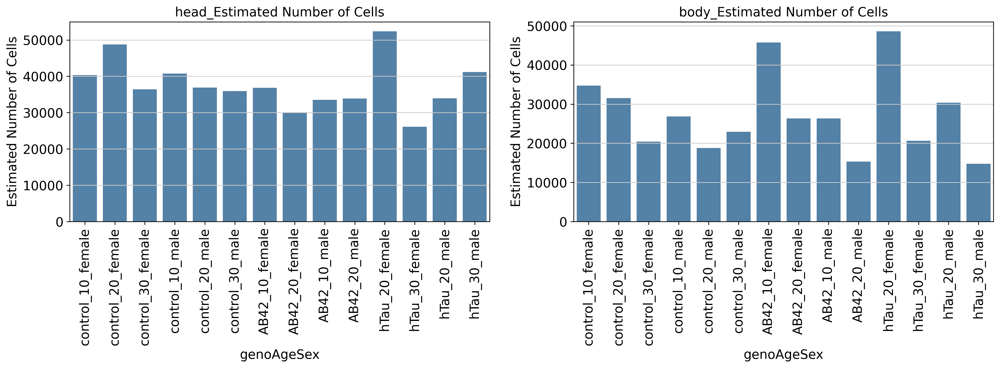

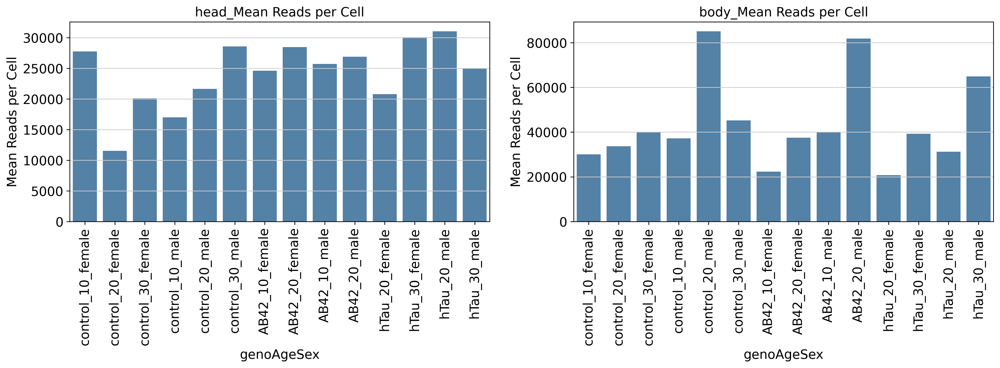

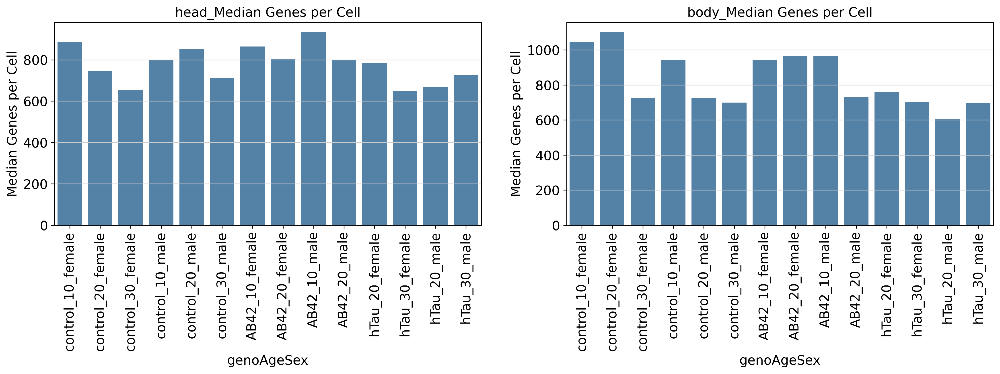

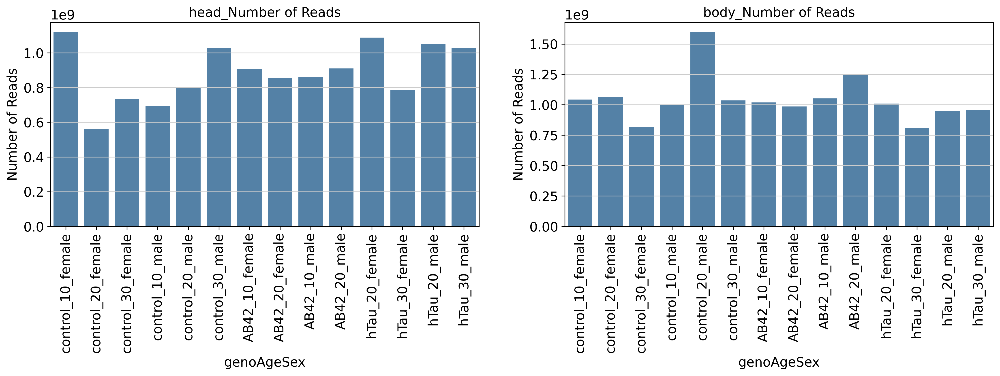

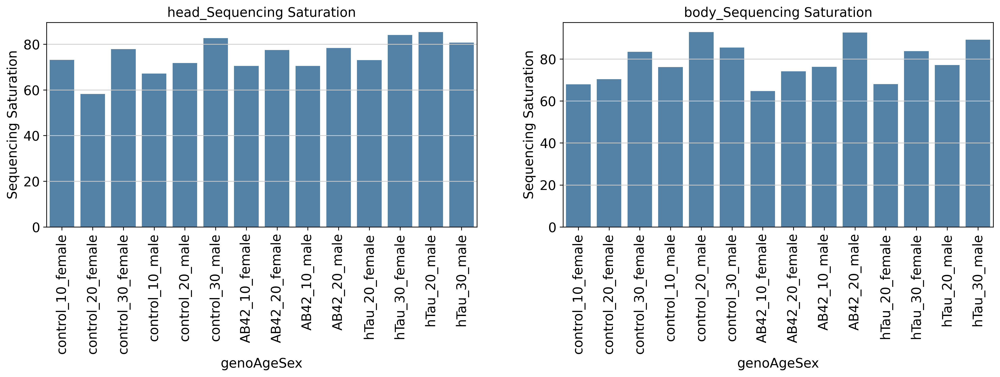

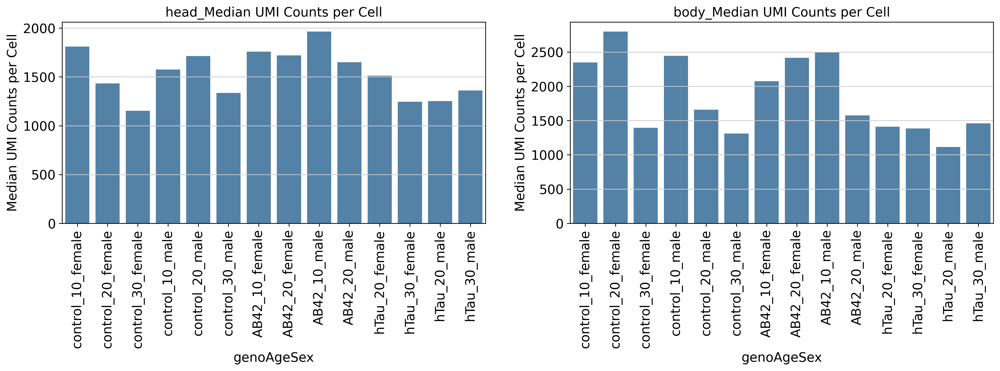

In [93]:
for feature in feature_L[:]:
    figs, axs = plt.subplots(1, 2, figsize=(18, 4))
    for n, tissue in enumerate(['head', 'body']):
        # print(feature, tissue)
        
        # sc.pl.violin(crSummary_Df[crSummary_Df.tissue == tissue], keys=feature, groupby='genoAgeSex', jitter=0.4, size=0.1, rotation=90, ax=axs[n],  show=False, )
        # sns.lineplot(data=crSummary_Df[crSummary_Df.tissue == tissue], x='genoAgeSex', y=feature, hue_order=genoAgeSex_L0, ax=axs[n])
        sns.barplot(data=crSummary_Df[crSummary_Df.tissue == tissue], x='genoAgeSex', y=feature,  ax=axs[n], color='steelblue') # hue_order=genoAgeSex_L0,
        
        # axs[0].set_xticklabels(rotation=90)
        axs[n].tick_params(axis='x', rotation=90)
        axs[n].title.set_text(f'{tissue}_{feature}')
    
    plt.savefig(f'{figure1PicFolder}/barplot__{feature}__groupbyGenoAgeSex.pdf', bbox_inches='tight')
    plt.show()